In [1]:
#| echo: false
#| output: false

%load_ext autoreload
%autoreload 2

In [2]:
import pandas as pd

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import geneinfo.ontology as go
go.email('your@email.com')

In [3]:
class left:
    def __rlshift__(self, df):
        "Left align columns of data frame: df << left()"
        left_aligned_df = df.style.set_properties(**{'text-align': 'left'})
        left_aligned_df = left_aligned_df.set_table_styles(
        [dict(selector = 'th', props=[('text-align', 'left')])])
        display(left_aligned_df)
        
df = pd.DataFrame(dict(name=['A', 'B'], desc=['bla bla bla bla', 'bla']))
df

,name,desc
0,A,bla bla bla bla
1,B,bla


## Global GO enrichment

**Enrichment against all GO terms with all protein coding genes as background:**

In [12]:
import geneinfo.utils as utils
gl = utils.GeneListCollection('google_sheet.csv')
repr(list(gl.get('sfari_all_conf')))

"['AFF2', 'AGTR2', 'AP1S2', 'AR', 'ARHGEF9', 'ARX', 'ATRX', 'BCORL1', 'BRWD3', 'CACNA1F', 'CASK', 'CD99L2', 'CDKL5', 'CHM', 'CLCN4', 'CNKSR2', 'DDX3X', 'DDX53', 'DMD', 'FAM47A', 'FGF13', 'FMR1', 'FRMPD4', 'GABRA3', 'GLRA2', 'GPC4', 'GRIA3', 'HCFC1', 'HDAC8', 'HNRNPH2', 'HUWE1', 'IL1RAPL1', 'IL1RAPL2', 'IQSEC2', 'KDM5C', 'KDM6A', 'LAS1L', 'MAOA', 'MAOB', 'MECP2', 'MSL3', 'NEXMIF', 'NLGN3', 'NLGN4X', 'OCRL', 'OFD1', 'OPHN1', 'PCDH11X', 'PCDH19', 'PHF8', 'PJA1', 'PLXNA3', 'PTCHD1', 'PTCHD1-AS', 'RAB39B', 'RHOXF1', 'RLIM', 'RPL10', 'RPS6KA3', 'SLC6A8', 'SLC7A3', 'SLC9A6', 'SMC1A', 'SYAP1', 'SYN1', 'SYP', 'TAF1', 'TBL1X', 'TBX22', 'TFE3', 'TMLHE', 'TSPAN7', 'UPF3B', 'USP9X', 'VSIG4', 'WNK3', 'ZNF711']"

In [13]:
genes = ['AFF2', 'AGTR2', 'AP1S2', 'AR', 'ARHGEF9', 'ARX', 'ATRX', 'BCORL1', 'BRWD3', 
         'CACNA1F', 'CASK', 'CD99L2', 'CDKL5', 'CHM', 'CLCN4', 'CNKSR2', 'DDX3X', 
         'DDX53', 'DMD', 'FAM47A', 'FGF13', 'FMR1', 'FRMPD4', 'GABRA3', 'GLRA2', 'GPC4',
         'GRIA3', 'HCFC1', 'HDAC8', 'HNRNPH2', 'HUWE1', 'IL1RAPL1', 'IL1RAPL2', 'IQSEC2', 
         'KDM5C', 'KDM6A', 'LAS1L', 'MAOA', 'MAOB', 'MECP2', 'MSL3', 'NEXMIF', 'NLGN3', 
         'NLGN4X', 'OCRL', 'OFD1', 'OPHN1', 'PCDH11X', 'PCDH19', 'PHF8', 'PJA1', 'PLXNA3', 
         'PTCHD1', 'PTCHD1-AS', 'RAB39B', 'RHOXF1', 'RLIM', 'RPL10', 'RPS6KA3', 'SLC6A8', 
         'SLC7A3', 'SLC9A6', 'SMC1A', 'SYAP1', 'SYN1', 'SYP', 'TAF1', 'TBL1X', 'TBX22', 
         'TFE3', 'TMLHE', 'TSPAN7', 'UPF3B', 'USP9X', 'VSIG4', 'WNK3', 'ZNF711']

In [17]:
go_results = go.go_enrichment(genes)
go_results.head(10)

Could not map gene symbol "PTCHD1-AS" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,BP,GO:0050804,e,7.683641e-07,0.009330,0.078947,0.004176,<GO:0050804>
1,CC,GO:0045211,e,5.857825e-06,0.010673,0.092105,0.009079,<GO:0045211>
2,BP,GO:0097105,e,3.991773e-06,0.024236,0.039474,0.000437,<GO:0097105>
3,MF,GO:0097621,e,4.021701e-05,0.047489,0.026316,0.000146,<GO:0097621>
4,MF,GO:0042043,e,1.706921e-05,0.047489,0.039474,0.000680,<GO:0042043>
5,MF,GO:0140693,e,2.707133e-05,0.047489,0.052632,0.002282,<GO:0140693>
6,MF,GO:0003682,e,4.084158e-05,0.047489,0.118421,0.021849,<GO:0003682>
7,CC,GO:0098983,e,8.024140e-05,0.048860,0.026316,0.000194,<GO:0098983>
8,CC,GO:0005634,e,8.045020e-05,0.048860,0.486842,0.273257,<GO:0005634>
9,MF,GO:0032452,e,5.261298e-05,0.048941,0.039474,0.000971,<GO:0032452>


**Show GO DAG for enrichment results:**

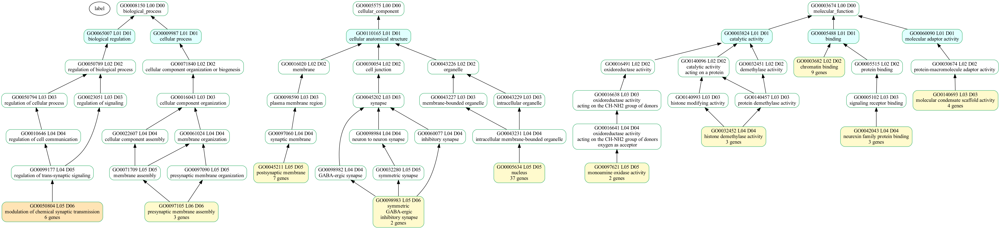

In [18]:
go.show_go_dag_enrichment_results(go_results.obj)

**Same but only for top 10 GO terms:**

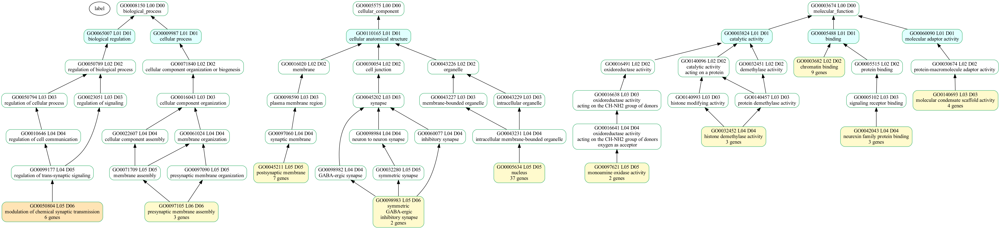

In [19]:
go.show_go_dag_enrichment_results(go_results.obj[:10])

**Descriptions of the same 10 GO terms:**

In [20]:
go.go_info(go_results.term_id[:10])

**<span style="color:gray;">GO:0050804:</span>** **modulation of chemical synaptic transmission**  
 Any process that modulates the frequency or amplitude of synaptic transmission, the process of communication from a neuron to a target (neuron, muscle, or secretory cell) across a synapse. Amplitude, in this case, refers to the change in postsynaptic membrane potential due to a single instance of synaptic transmission.    

 ----

**<span style="color:gray;">GO:0045211:</span>** **postsynaptic membrane**  
 A specialized area of membrane facing the presynaptic membrane on the tip of the nerve ending and separated from it by a minute cleft (the synaptic cleft). Neurotransmitters cross the synaptic cleft and transmit the signal to the postsynaptic membrane.    

 ----

**<span style="color:gray;">GO:0097105:</span>** **presynaptic membrane assembly**  
 The aggregation, arrangement and bonding together of a set of components to form a presynaptic membrane, including any proteins associated with the membrane, but excluding other cellular components. A presynaptic membrane is a specialized area of membrane of the axon terminal that faces the plasma membrane of the neuron or muscle fiber with which the axon terminal establishes a synaptic junction.    

 ----

**<span style="color:gray;">GO:0097621:</span>** **monoamine oxidase activity**  
 Catalysis of the reaction: RCH2NHR' + H2O + O2 = RCHO + R'NH2 + H2O2.    

 ----

**<span style="color:gray;">GO:0042043:</span>** **neurexin family protein binding**  
 Binding to a neurexin, a synaptic cell surface protein related to latrotoxin receptor, laminin and agrin. Neurexins act as cell recognition molecules at nerve terminals.    

 ----

**<span style="color:gray;">GO:0140693:</span>** **molecular condensate scaffold activity**  
 Binding and bringing together two or more macromolecules in contact, permitting those molecules to organize as a molecular condensate.    

 ----

**<span style="color:gray;">GO:0003682:</span>** **chromatin binding**  
 Binding to chromatin, the network of fibers of DNA, protein, and sometimes RNA, that make up the chromosomes of the eukaryotic nucleus during interphase.    

 ----

**<span style="color:gray;">GO:0098983:</span>** **symmetric, GABA-ergic, inhibitory synapse**  
 A neuron to neuron synapse that lacks an electron dense postsynaptic specialization, uses GABA as a neurotransmitter and whose activity results in inhibitory postsynaptic potentials.    

 ----

**<span style="color:gray;">GO:0005634:</span>** **nucleus**  
 A membrane-bounded organelle of eukaryotic cells in which chromosomes are housed and replicated. In most cells, the nucleus contains all of the cell's chromosomes except the organellar chromosomes, and is the site of RNA synthesis and processing. In some species, or in specialized cell types, RNA metabolism or DNA replication may be absent.    

 ----

**<span style="color:gray;">GO:0032452:</span>** **histone demethylase activity**  
 Catalysis of the removal of a methyl group from a histone.    

 ----

**Show the GO DAG for a set of GO terms and their parent terms:**

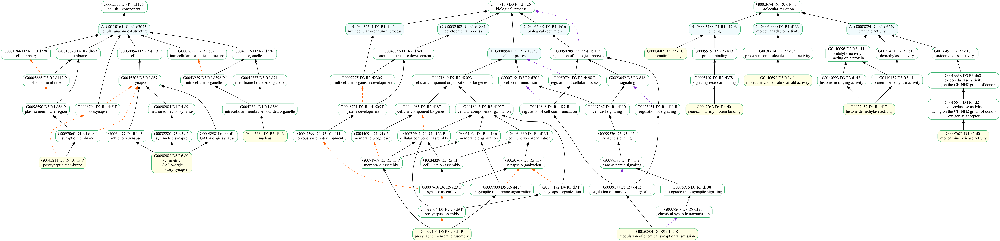

In [21]:
go.show_go_dag_for_terms(go_results.term_id[:10])

**Specifying a custom set of background genes:**

The query genes should be a subset of the background genes:

In [27]:
all_protein_coding = set(pd.read_csv('geneinfo_cache/9606_protein_genes.txt', sep='\t').Symbol)
# only the first 50 genes:
subset_background = list(all_protein_coding)[:50] + genes

In [28]:
go_results = go.go_enrichment(genes, background_genes=subset_background)
go_results

Could not map gene symbol "PTCHD1-AS" to ncbi id
Could not map gene symbol "PTCHD1-AS" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj


**Use only the X chromosome as background:**

In [29]:
go_results = go.go_enrichment(genes, background_chrom='X')
go_results

Could not map gene symbol "PTCHD1-AS" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj
0,BP,GO:0050804,e,4.158911e-07,0.000937,0.078947,0.007034,<GO:0050804>
1,CC,GO:0043197,e,2.772412e-05,0.004673,0.065789,0.007034,<GO:0043197>
2,CC,GO:0045211,e,3.783425e-05,0.004673,0.092105,0.015240,<GO:0045211>
3,CC,GO:0045202,e,1.992185e-05,0.004673,0.105263,0.018757,<GO:0045202>
4,CC,GO:0005654,e,3.475823e-05,0.004673,0.355263,0.168816,<GO:0005654>
5,CC,GO:0098685,e,5.857231e-05,0.005787,0.052632,0.004689,<GO:0098685>
6,BP,GO:0006338,e,5.644060e-06,0.006361,0.157895,0.037515,<GO:0006338>
7,BP,GO:0045944,e,1.386155e-05,0.010415,0.171053,0.046893,<GO:0045944>
8,CC,GO:0032991,e,4.849450e-04,0.039927,0.092105,0.021102,<GO:0032991>
9,CC,GO:0071339,e,6.820063e-04,0.048130,0.039474,0.003517,<GO:0071339>


## Enrichment among a subset of GO terms

Extract terms matching regular expression:

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2024-10-27) 44,017 Terms; optional_attrs(comment def relationship synonym xref)


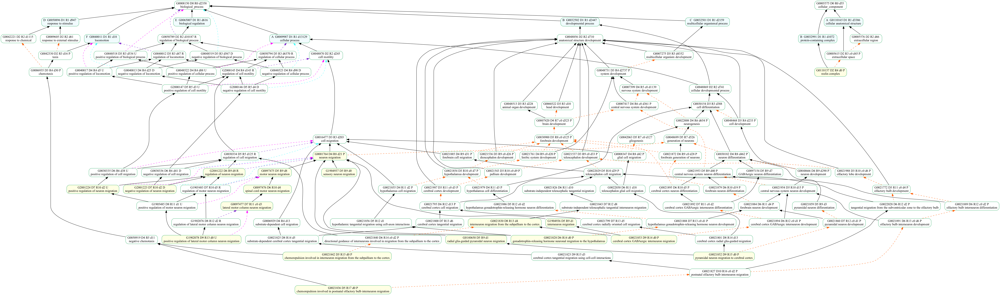

In [30]:
#target_terms = go.get_terms_for_go_regex('brain')
#target_terms = go.get_terms_for_go_regex('microtubul')
# target_terms = go.get_terms_for_go_regex('spindle')
target_terms = go.get_terms_for_go_regex(r'neuron\S* migration')
go.show_go_dag_for_terms(target_terms)

In [31]:
go_results = go.go_enrichment(genes, terms=target_terms, list_study_genes=True)
go_results.head()

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2024-10-27) 44,017 Terms; optional_attrs(def relationship)


Could not map gene symbol "PTCHD1-AS" to ncbi id


,namespace,term_id,e/p,pval_uncorr,p_fdr_bh,ratio,bg_ratio,obj,study_genes
0,CC,GO:0032991,e,0.009216,0.036864,0.092105,0.031025,<GO:0032991>,"[AR, DMD, HCFC1, MECP2, RPL10, FRMPD4, VSIG4]"


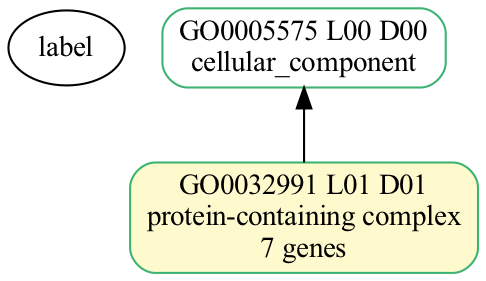

In [32]:
go.show_go_dag_enrichment_results(go_results.obj)

Extract terms matching two regular expressions in any order:

geneinfo_cache/go-basic.obo: fmt(1.2) rel(2024-10-27) 44,017 Terms; optional_attrs(comment def relationship synonym xref)


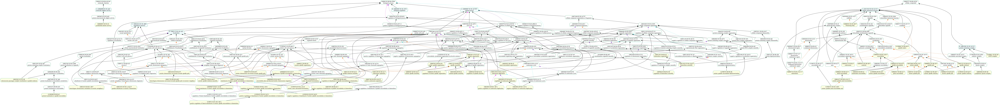

In [33]:
pattern_one = r'microtub\S*'
pattern_two = r'spindle'
regex = fr"(?=.*({pattern_one}))(?=.*({pattern_two}))(?=.*)"

target_terms = go.get_terms_for_go_regex(regex)
go.show_go_dag_for_terms(target_terms)

In [34]:
go_results = go.go_enrichment(motor_genes_df.symbol, terms=target_terms, list_study_genes=True)
go_results.head()

NameError: name 'motor_genes_df' is not defined

In [ ]:
go.show_go_dag_enrichment_results(go_results.obj)